   trip_duration_days  miles_traveled  total_receipts_amount  expected_output  \
0                   3            93.0                   1.42           364.51   
1                   1            55.0                   3.60           126.06   
2                   1            47.0                  17.97           128.91   
3                   2            13.0                   4.67           203.52   
4                   3            88.0                   5.78           380.37   

   miles_per_day  receipts_per_day  reimbursement_per_day  \
0      31.000000          0.473333             121.503333   
1      55.000000          3.600000             126.060000   
2      47.000000         17.970000             128.910000   
3       6.500000          2.335000             101.760000   
4      29.333333          1.926667             126.790000   

   receipts_ends_in_49_or_99  is_sweet_spot_trip  is_efficiency_sweet_spot  \
0                      False               False                    

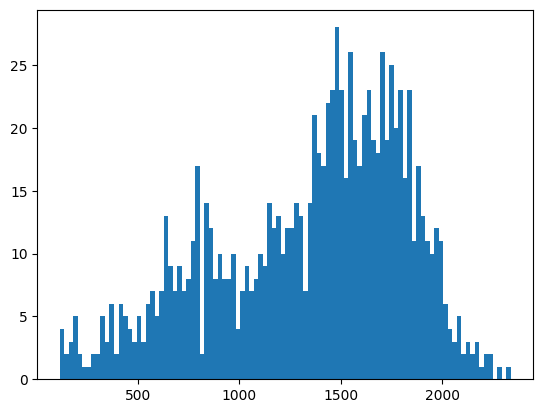

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

df = pd.read_csv("../public_cases_with_features.csv")

print(df.head())

plt.hist(df["expected_output"], bins=100)
plt.show()

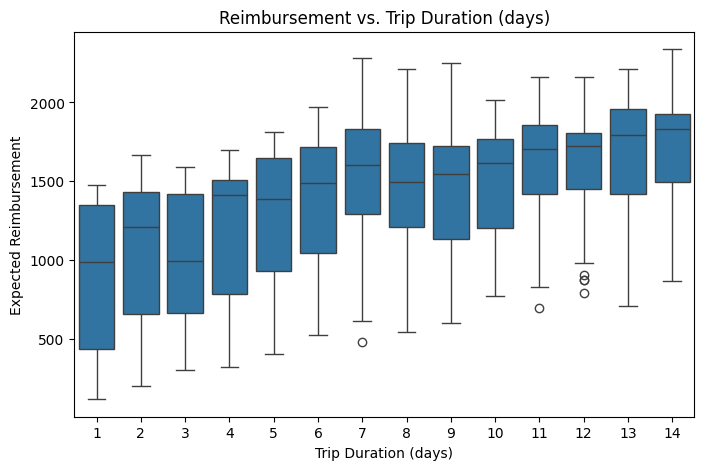

In [2]:
plt.figure(figsize=(8, 5))
sns.boxplot(x="trip_duration_days", y="expected_output", data=df)
plt.title("Reimbursement vs. Trip Duration (days)")
plt.xlabel("Trip Duration (days)")
plt.ylabel("Expected Reimbursement")
plt.show()


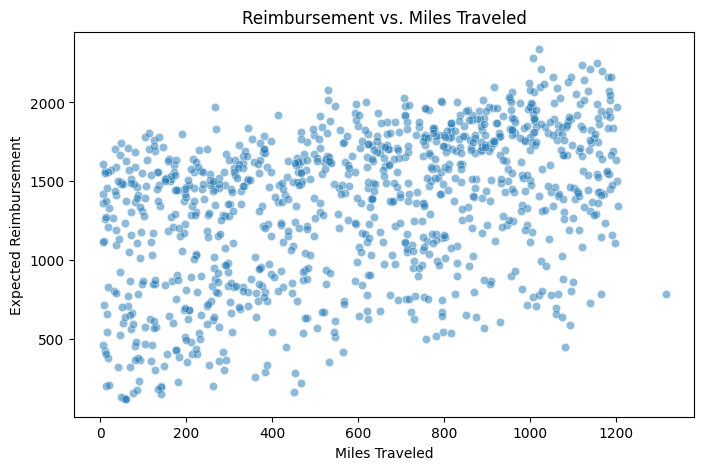

In [3]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x="miles_traveled", y="expected_output", data=df, alpha=0.5)
plt.title("Reimbursement vs. Miles Traveled")
plt.xlabel("Miles Traveled")
plt.ylabel("Expected Reimbursement")
plt.show()


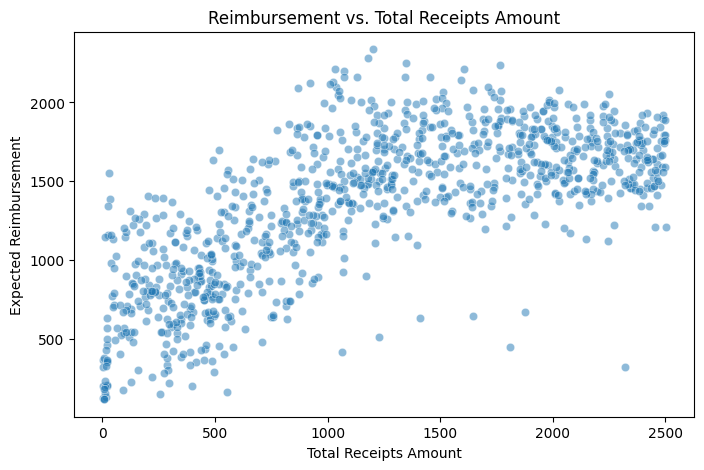

In [4]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x="total_receipts_amount", y="expected_output", data=df, alpha=0.5)
plt.title("Reimbursement vs. Total Receipts Amount")
plt.xlabel("Total Receipts Amount")
plt.ylabel("Expected Reimbursement")
plt.show()


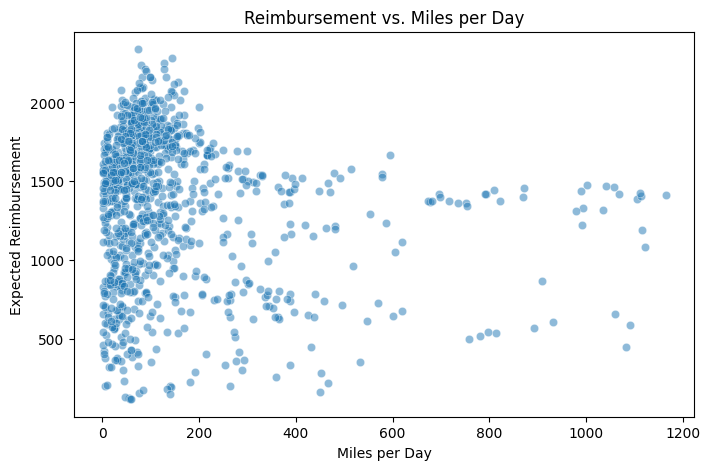

In [5]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x="miles_per_day", y="expected_output", data=df, alpha=0.5)
plt.title("Reimbursement vs. Miles per Day")
plt.xlabel("Miles per Day")
plt.ylabel("Expected Reimbursement")
plt.show()


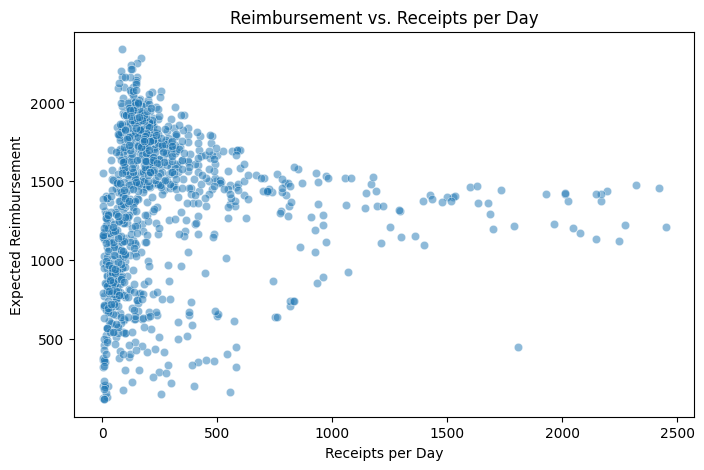

In [6]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x="receipts_per_day", y="expected_output", data=df, alpha=0.5)
plt.title("Reimbursement vs. Receipts per Day")
plt.xlabel("Receipts per Day")
plt.ylabel("Expected Reimbursement")
plt.show()


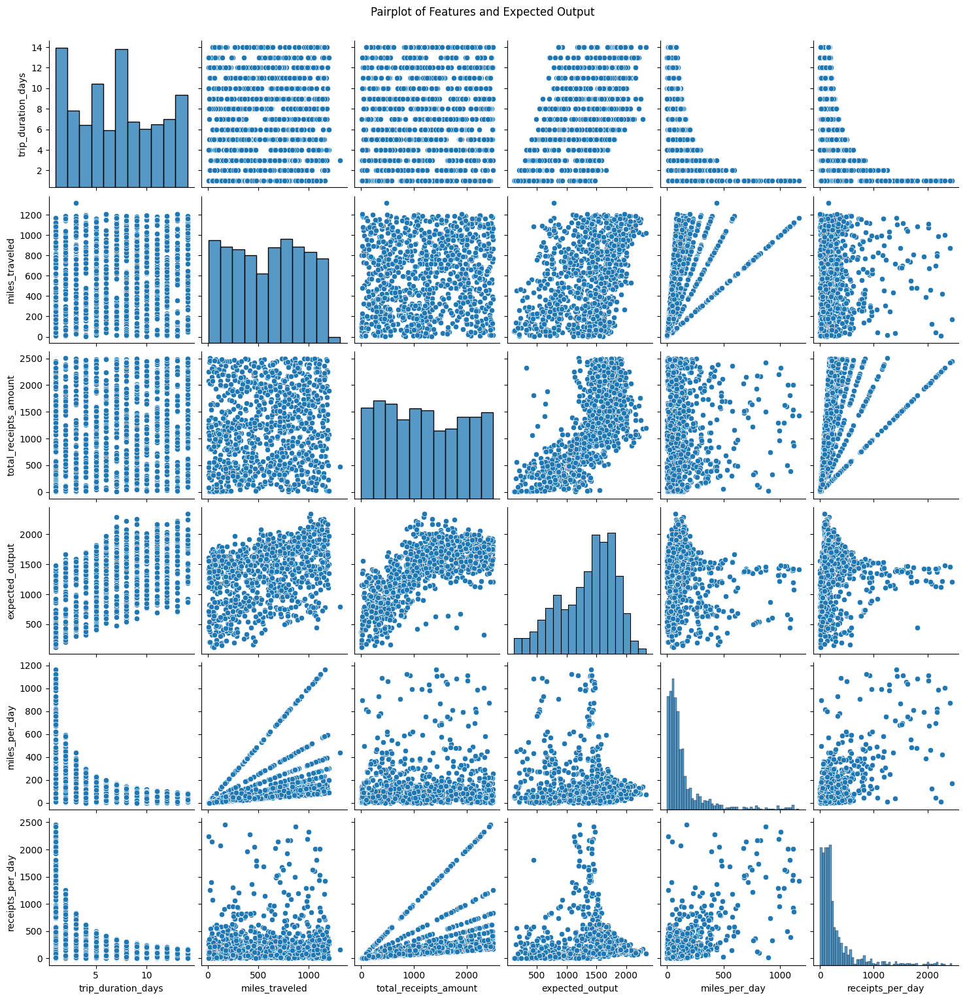

In [7]:
sns.pairplot(
    df[
        [
            "trip_duration_days",
            "miles_traveled",
            "total_receipts_amount",
            "expected_output",
            "miles_per_day",
            "receipts_per_day",
        ]
    ]
)
plt.suptitle("Pairplot of Features and Expected Output", y=1.02)
plt.show()


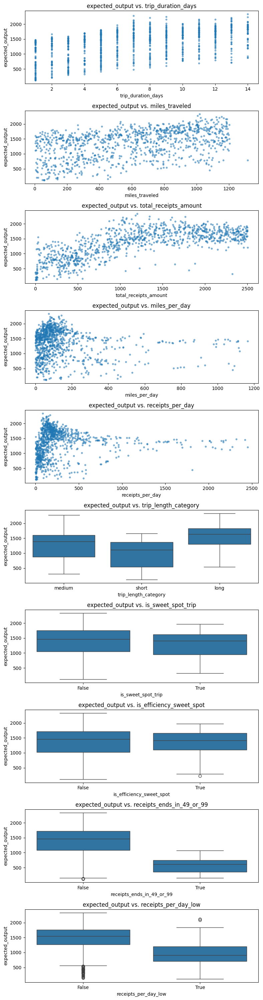

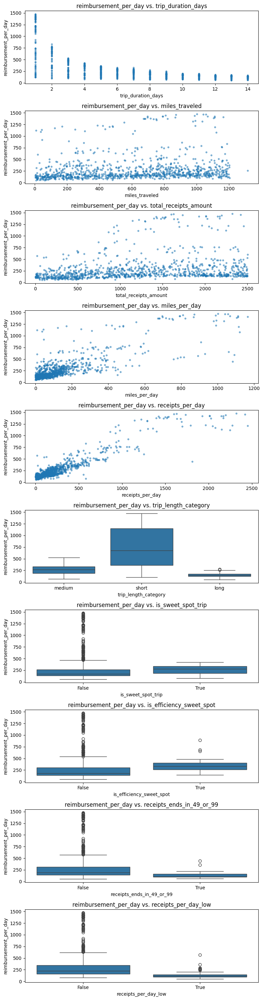

In [13]:
# List of features to plot (mix of numeric, categorical, boolean)
features = [
    "trip_duration_days",
    "miles_traveled",
    "total_receipts_amount",
    "miles_per_day",
    "receipts_per_day",
    "trip_length_category",  # categorical
    "is_sweet_spot_trip",  # boolean
    "is_efficiency_sweet_spot",  # boolean
    "receipts_ends_in_49_or_99",  # boolean
    "receipts_per_day_low",  # boolean
]

n = len(features)

for output in ["expected_output", "reimbursement_per_day"]:
    fig, axes = plt.subplots(n, 1, figsize=(8, 3 * n), sharey=True)

    for i, feature in enumerate(features):
        ax = axes[i]
        if df[feature].dtype == "bool" or df[feature].nunique() == 2:
            # Boolean: use boxplot
            sns.boxplot(x=feature, y=output, data=df, ax=ax)
        elif df[feature].dtype == "object" or df[feature].nunique() < 10:
            # Categorical: use boxplot
            sns.boxplot(x=feature, y=output, data=df, ax=ax)
        else:
            # Numeric: use scatterplot
            ax.scatter(df[feature], df[output], alpha=0.5, s=10)
        ax.set_xlabel(feature)
        ax.set_ylabel(output)
        ax.set_title(f"{output} vs. {feature}")

    plt.tight_layout()
    plt.show()


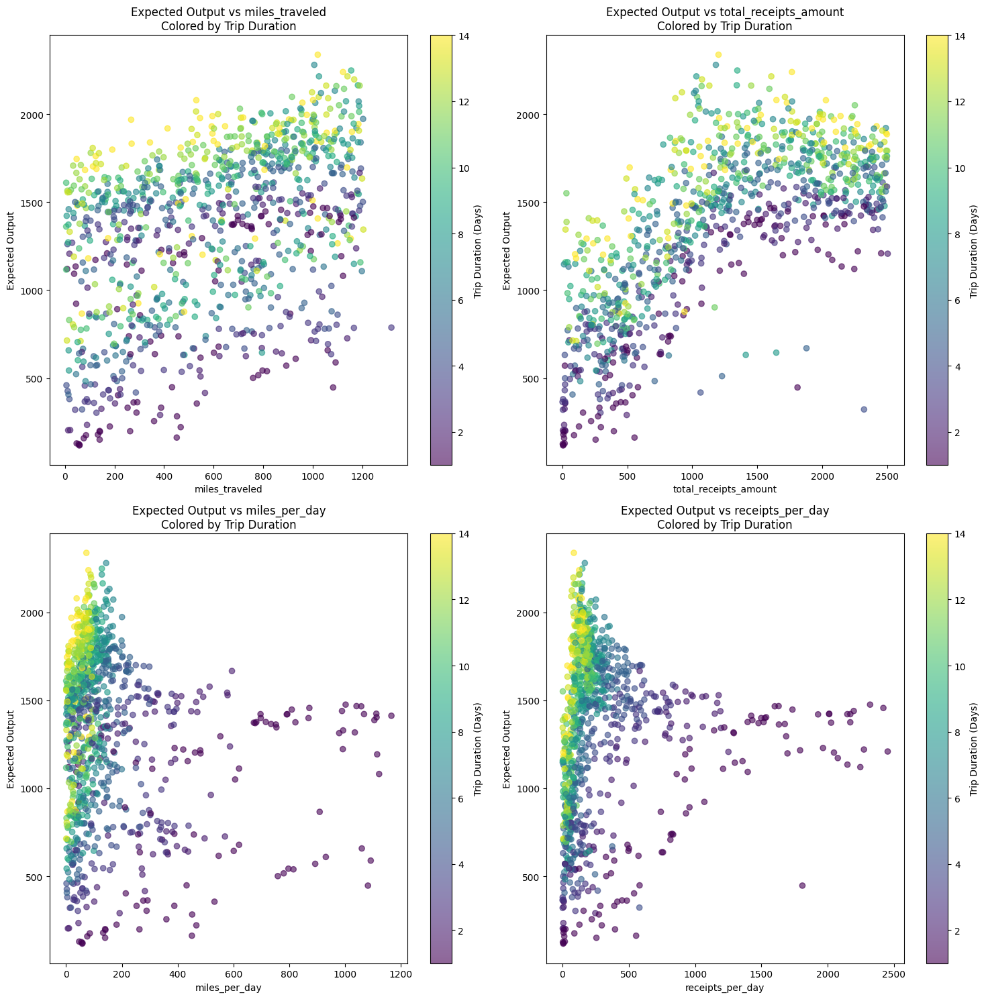

In [9]:
# Create scatter plots of main features colored by trip duration
features = [
    "miles_traveled",
    "total_receipts_amount", 
    "miles_per_day",
    "receipts_per_day"
]

fig, axes = plt.subplots(2, 2, figsize=(15, 15))
axes = axes.ravel()

for i, feature in enumerate(features):
    scatter = axes[i].scatter(
        df[feature], 
        df["expected_output"],
        c=df["trip_duration_days"],
        cmap="viridis",
        alpha=0.6
    )
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Expected Output")
    axes[i].set_title(f"Expected Output vs {feature}\nColored by Trip Duration")
    fig.colorbar(scatter, ax=axes[i], label="Trip Duration (Days)")

plt.tight_layout()
plt.show()


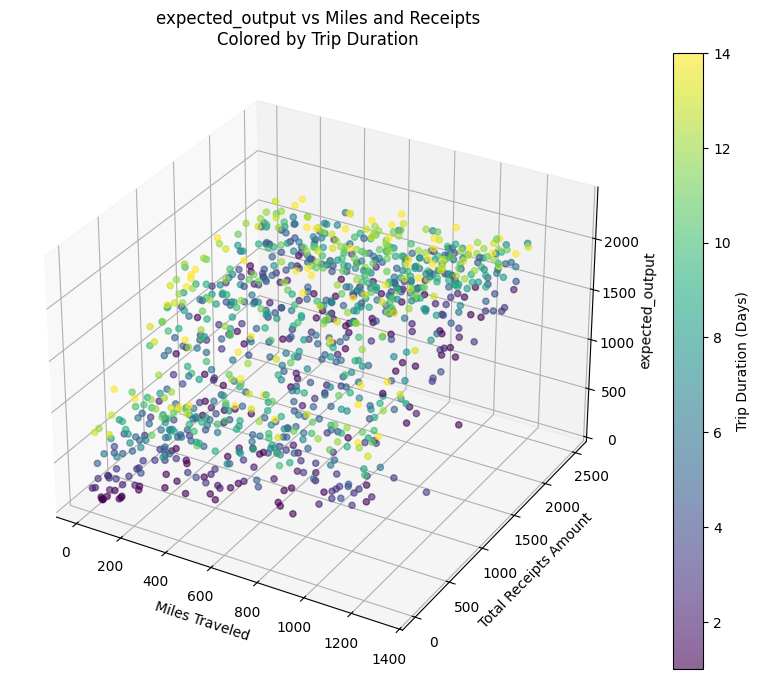

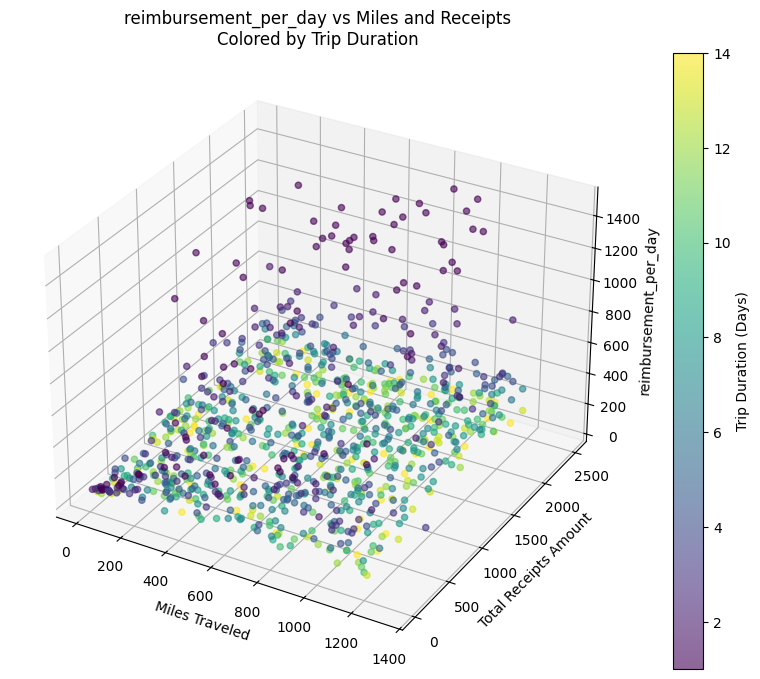

In [15]:
for output in ["expected_output", "reimbursement_per_day"]:
    # Create 3D scatter plot of miles, receipts and days
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    scatter = ax.scatter(
        df["miles_traveled"],
        df["total_receipts_amount"], 
        df[output],
        c=df["trip_duration_days"],
        cmap="viridis",
        alpha=0.6
    )

    ax.set_xlabel("Miles Traveled")
    ax.set_ylabel("Total Receipts Amount")
    ax.set_zlabel(output)
    ax.set_title(f"{output} vs Miles and Receipts\nColored by Trip Duration")

    fig.colorbar(scatter, label="Trip Duration (Days)")
    plt.show()



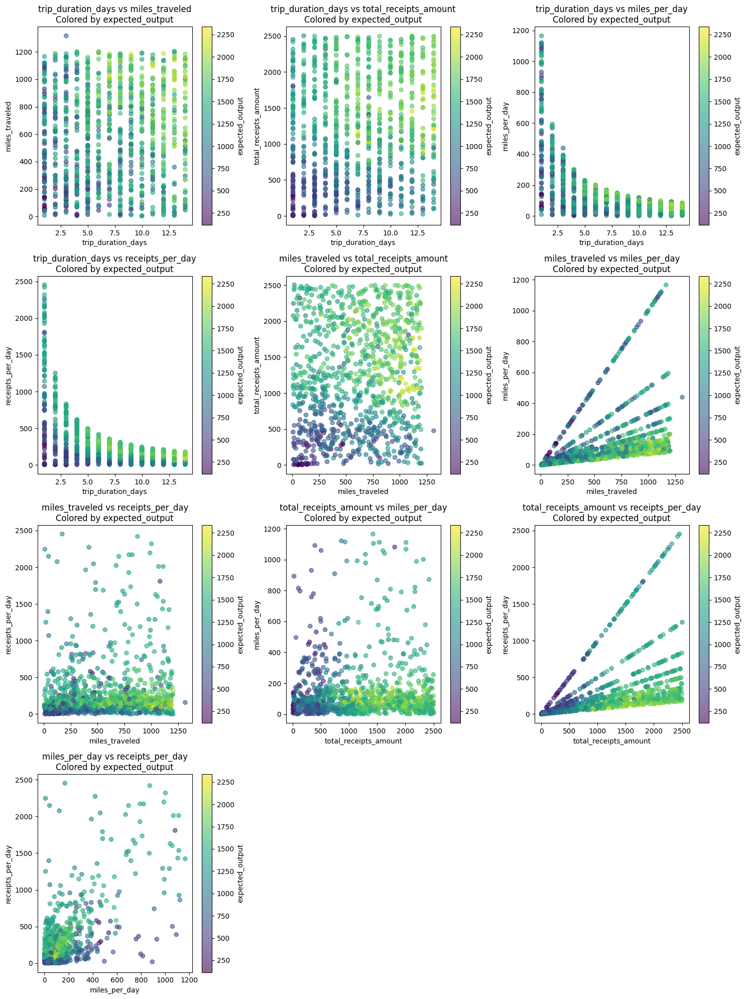

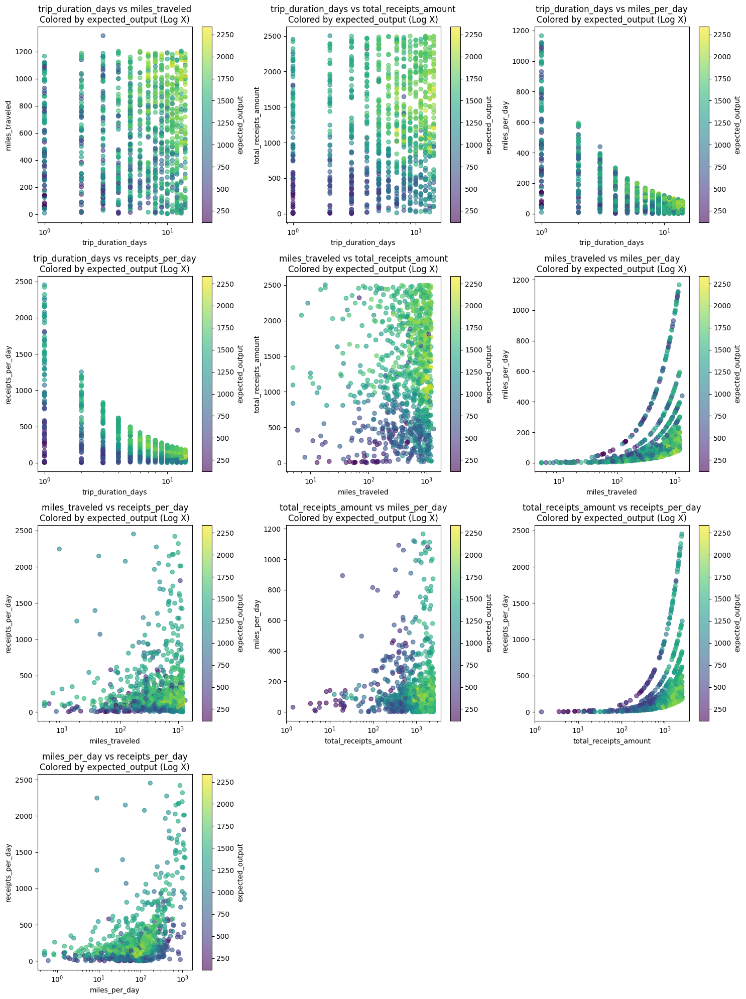

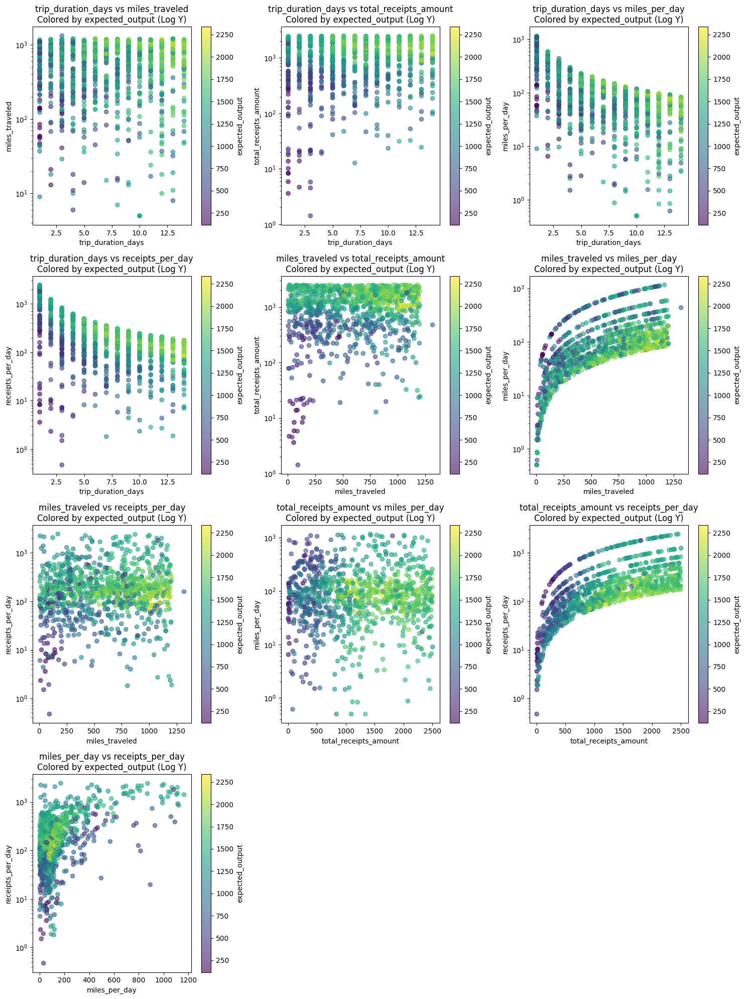

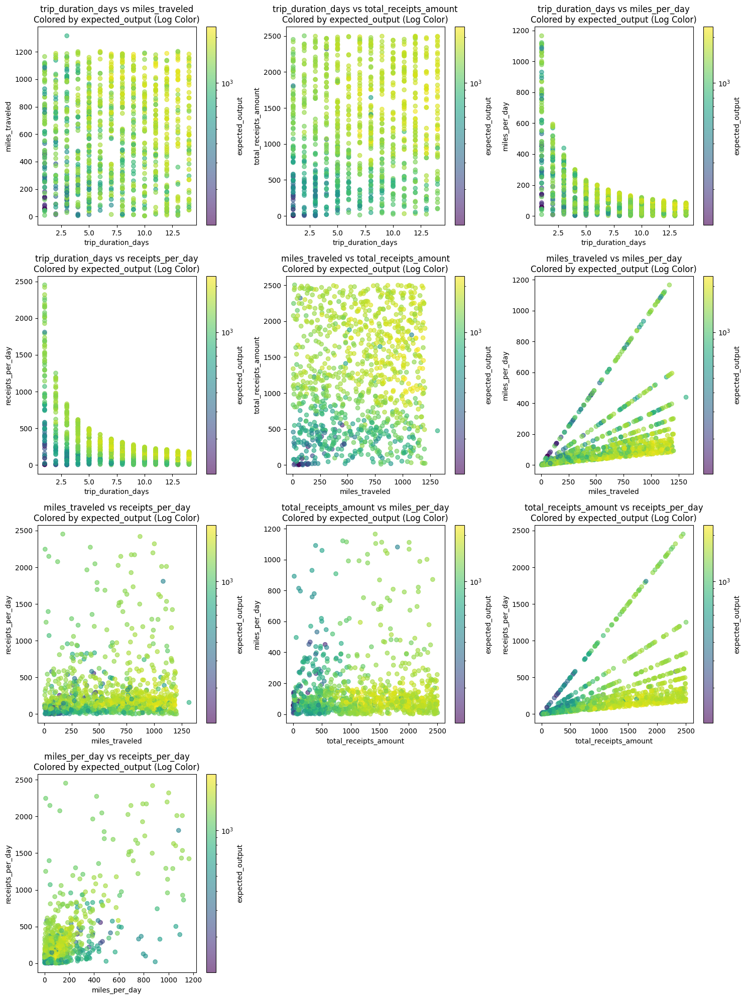

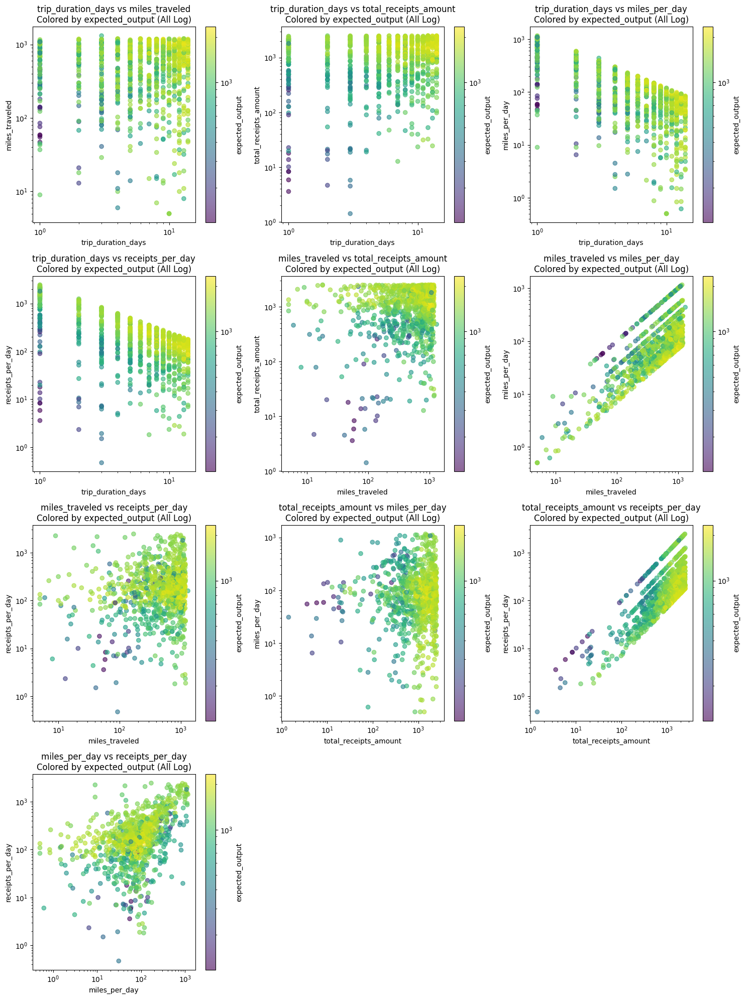

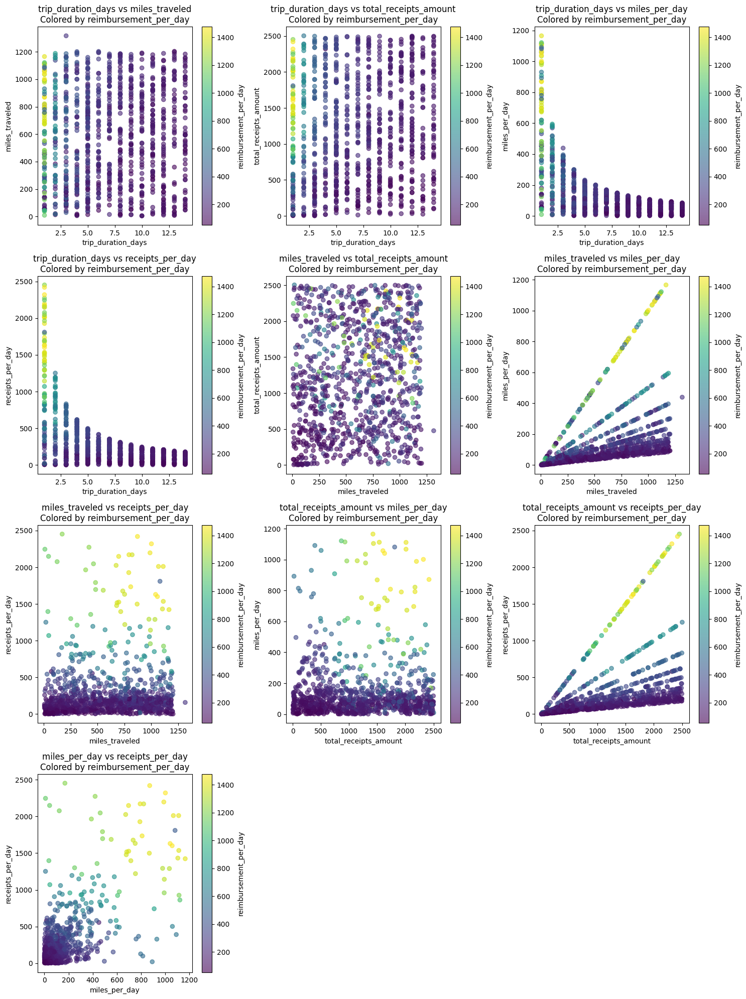

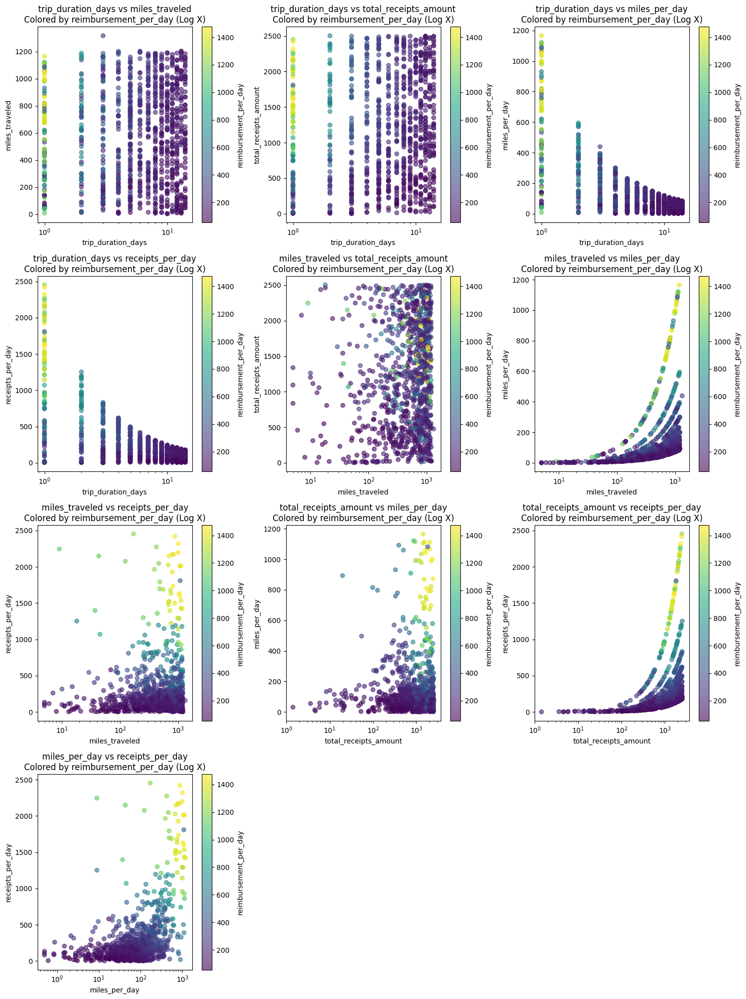

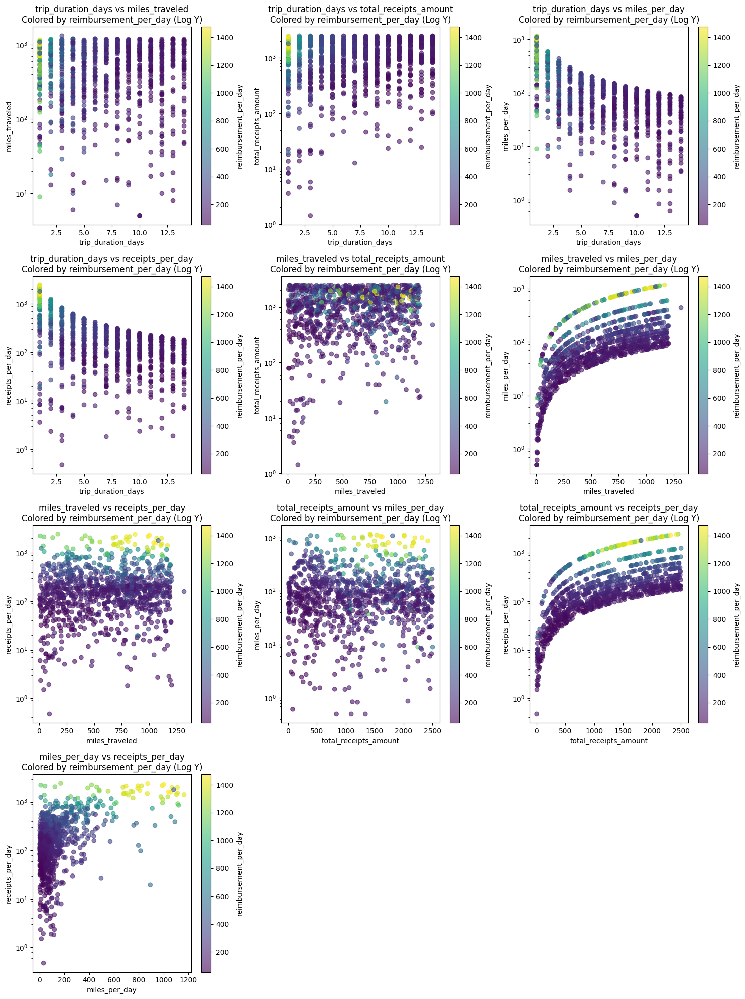

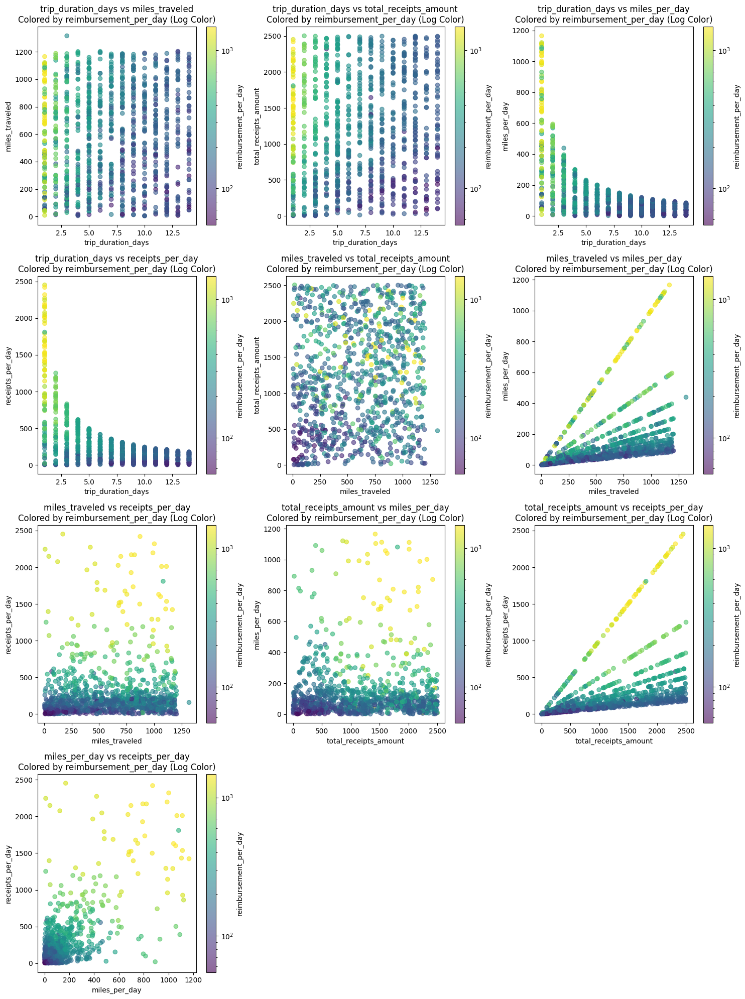

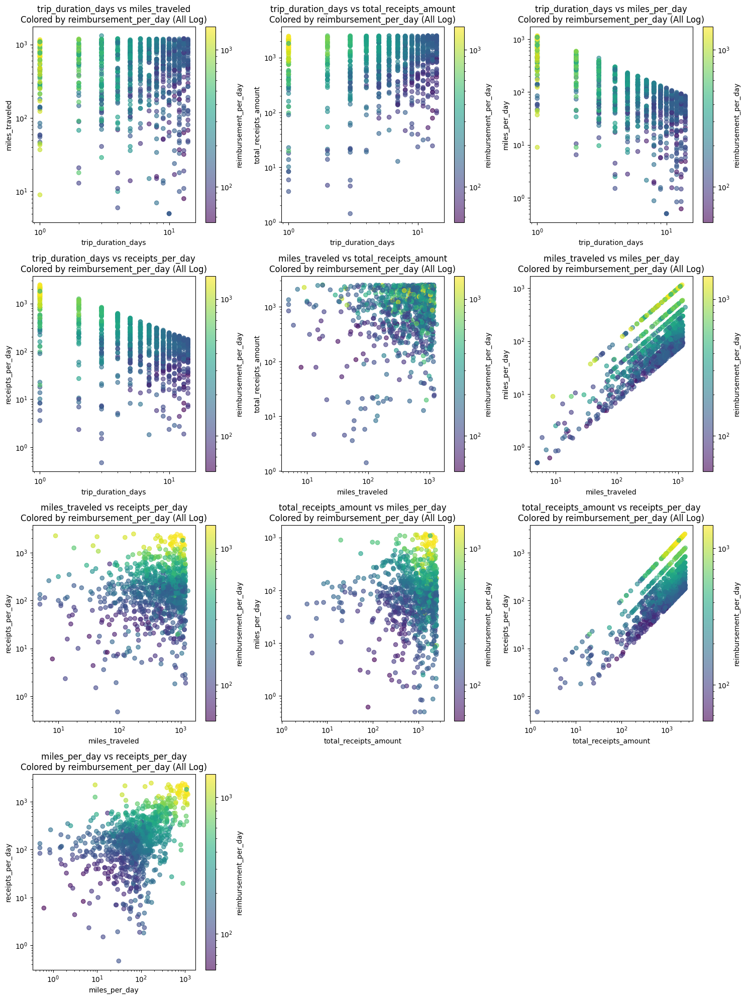

In [18]:
import matplotlib

# Get continuous features
continuous_features = [
    "trip_duration_days",
    "miles_traveled", 
    "total_receipts_amount",
    "miles_per_day",
    "receipts_per_day",
]

# Create plots for each pair of features
n_features = len(continuous_features)
n_plots = (n_features * (n_features - 1)) // 2

# Calculate number of rows/cols needed
n_cols = 3
n_rows = (n_plots + n_cols - 1) // n_cols

for output in ["expected_output", "reimbursement_per_day"]:
    # Regular scale
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    axes = axes.ravel()

    plot_idx = 0
    for i in range(n_features):
        for j in range(i+1, n_features):
            scatter = axes[plot_idx].scatter(
                df[continuous_features[i]],
                df[continuous_features[j]], 
                c=df[output],
                cmap="viridis",
                alpha=0.6
            )
            axes[plot_idx].set_xlabel(continuous_features[i])
            axes[plot_idx].set_ylabel(continuous_features[j])
            axes[plot_idx].set_title(f"{continuous_features[i]} vs {continuous_features[j]}\nColored by {output}")
            fig.colorbar(scatter, ax=axes[plot_idx], label=output)
            plot_idx += 1

    # Hide any empty subplots
    for i in range(plot_idx, len(axes)):
        axes[i].set_visible(False)

    plt.tight_layout()
    plt.show()

    # Log x scale
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    axes = axes.ravel()

    plot_idx = 0
    for i in range(n_features):
        for j in range(i+1, n_features):
            scatter = axes[plot_idx].scatter(
                df[continuous_features[i]],
                df[continuous_features[j]], 
                c=df[output],
                cmap="viridis",
                alpha=0.6
            )
            axes[plot_idx].set_xscale('log')
            axes[plot_idx].set_xlabel(continuous_features[i])
            axes[plot_idx].set_ylabel(continuous_features[j])
            axes[plot_idx].set_title(f"{continuous_features[i]} vs {continuous_features[j]}\nColored by {output} (Log X)")
            fig.colorbar(scatter, ax=axes[plot_idx], label=output)
            plot_idx += 1

    # Hide any empty subplots
    for i in range(plot_idx, len(axes)):
        axes[i].set_visible(False)

    plt.tight_layout()
    plt.show()

    # Log y scale
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    axes = axes.ravel()

    plot_idx = 0
    for i in range(n_features):
        for j in range(i+1, n_features):
            scatter = axes[plot_idx].scatter(
                df[continuous_features[i]],
                df[continuous_features[j]], 
                c=df[output],
                cmap="viridis",
                alpha=0.6
            )
            axes[plot_idx].set_yscale('log')
            axes[plot_idx].set_xlabel(continuous_features[i])
            axes[plot_idx].set_ylabel(continuous_features[j])
            axes[plot_idx].set_title(f"{continuous_features[i]} vs {continuous_features[j]}\nColored by {output} (Log Y)")
            fig.colorbar(scatter, ax=axes[plot_idx], label=output)
            plot_idx += 1

    # Hide any empty subplots
    for i in range(plot_idx, len(axes)):
        axes[i].set_visible(False)

    plt.tight_layout()
    plt.show()

    # Log colorbar scale
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    axes = axes.ravel()

    plot_idx = 0
    for i in range(n_features):
        for j in range(i+1, n_features):
            scatter = axes[plot_idx].scatter(
                df[continuous_features[i]],
                df[continuous_features[j]], 
                c=df[output],
                cmap="viridis",
                alpha=0.6,
                norm=matplotlib.colors.LogNorm()
            )
            axes[plot_idx].set_xlabel(continuous_features[i])
            axes[plot_idx].set_ylabel(continuous_features[j])
            axes[plot_idx].set_title(f"{continuous_features[i]} vs {continuous_features[j]}\nColored by {output} (Log Color)")
            fig.colorbar(scatter, ax=axes[plot_idx], label=output)
            plot_idx += 1

    # Hide any empty subplots
    for i in range(plot_idx, len(axes)):
        axes[i].set_visible(False)

    plt.tight_layout()
    plt.show()

    # All log scales
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    axes = axes.ravel()

    plot_idx = 0
    for i in range(n_features):
        for j in range(i+1, n_features):
            scatter = axes[plot_idx].scatter(
                df[continuous_features[i]],
                df[continuous_features[j]], 
                c=df[output],
                cmap="viridis",
                alpha=0.6,
                norm=matplotlib.colors.LogNorm()
            )
            axes[plot_idx].set_xscale('log')
            axes[plot_idx].set_yscale('log')
            axes[plot_idx].set_xlabel(continuous_features[i])
            axes[plot_idx].set_ylabel(continuous_features[j])
            axes[plot_idx].set_title(f"{continuous_features[i]} vs {continuous_features[j]}\nColored by {output} (All Log)")
            fig.colorbar(scatter, ax=axes[plot_idx], label=output)
            plot_idx += 1

    # Hide any empty subplots
    for i in range(plot_idx, len(axes)):
        axes[i].set_visible(False)

    plt.tight_layout()
    plt.show()
